In [1]:
#To autoreload a function if it is changed
%load_ext autoreload
%autoreload 2

In [2]:
import scanpy as sc 
import anndata
import numpy as np 
import pandas as pds
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
import re
import pandas as pd 


from utils import plot_histogram
from var import sc_data_folder, results_folder, today, color

In [3]:
#set seed to 0 for reproducibility of results
np.random.seed(0)

In [4]:
#define which dataset to use
dataset = '49_04_l3_3_wt_gex'

In [5]:
#Create figures folder
figures_folder = os.path.join(results_folder, f'figures/{dataset}/qc/')
if not os.path.exists(figures_folder):
    os.makedirs(figures_folder)

## 1. Load .h5ad and mapping file

In [6]:
def read_10x_output(file_path, smp_list, metadata=None, type = 'raw', umi_filter=5):
    import os
    
    #Writing output from separate samples, processed using CellRanger, into a dictionary of Scanpy objects:
    ad = {}

    #Generate AnnData for each sample
    for sample_name in smp_list:
        path = file_path + sample_name
        for i in os.listdir(path):
            #filter for raw and filtered files
            if i==f'{type}_feature_bc_matrix':
                mtx_folder = i
        #read in matrix, features and barcodes
        mtx_folder_path = f'{file_path}{sample_name}/{mtx_folder}/'
        adata_init = sc.read_mtx(f'{mtx_folder_path}matrix.mtx.gz')
        #data wrangling for features_df to have the same format and column headers as if it is read with sc.read_10x_h5()
        features_df = features_df = pd.read_csv(f'{mtx_folder_path}features.tsv.gz', sep='\t', header=None, names=['gene_ids', 'gene_names', 'feature_types', 'genome'])
        features_df = features_df.set_index('gene_names')
        features_df['genome'] = 'GRCh38'
        
        barcodes_df = pd.read_csv(f'{mtx_folder_path}barcodes.tsv.gz', sep='\t', header=None, names=['barcodes'])
        
        #check if count matrix needs to be transposed
        if adata_init.shape[0] == features_df.shape[0]:
            #transpose the matrix to correct for dimensionality 
            adata = anndata.AnnData(X=adata_init.X.T.copy(), obs=barcodes_df, var=features_df)
        else:
            adata = anndata.AnnData(X=adata_init.X.copy(), obs=barcodes_df, var=features_df)
        ad[sample_name] = adata
        ad[sample_name].var.rename(columns = {'gene_ids':'ENSEMBL'}, inplace = True)
        ad[sample_name].var['SYMBOL'] = ad[sample_name].var.index
        ad[sample_name].var.index = ad[sample_name].var['ENSEMBL']
        ad[sample_name].var.drop(columns=['ENSEMBL'], inplace=True)
        #ad[sample_name].var_names_make_unique() 
        
        
        sc.pp.calculate_qc_metrics(ad[sample_name], inplace=True)
        ad[sample_name] = ad[sample_name][ad[sample_name].obs['total_counts'] > umi_filter, :]
        ad[sample_name].var['mt'] = [gene.startswith('mt-') 
                                     for gene in ad[sample_name].var['SYMBOL'].str.lower()]
        ad[sample_name].obs['mt_frac'] = (ad[sample_name][:, 
               ad[sample_name].var['mt'].tolist()].X.sum(1).A.squeeze() 
                                          / ad[sample_name].obs['total_counts'])
        
        ad[sample_name].obs['sample'] = sample_name
        ad[sample_name].obs['barcode'] = ad[sample_name].obs_names
        ad[sample_name].obs_names = ad[sample_name].obs['sample']+"_"+ad[sample_name].obs['barcode']

    #Merge AnnData objects from all the samples together    
    from scipy.sparse import vstack
    stack = vstack([ad[x].X for x in smp_list]) # stack data
    adata = sc.AnnData(stack, var = ad[smp_list[0]].var)
    adata.obs = pd.concat([ad[x].obs for x in smp_list], axis = 0)

    if metadata is not None:
        #Add cleaned metadata to the Anndata.obs table
        obs_merged = pd.merge(left = adata.obs, right = metadata, 
                              how = "left", left_on="sample", right_on="sample")
        obs_merged.index = obs_merged['sample']+"_"+obs_merged['barcode']
        print(obs_merged.index.equals(adata.obs.index))
        adata.obs = obs_merged

    return adata, ad


In [7]:
#Create a sample list in form of a dataframe to be concatenated by the read_10x_output function
sample_list = pd.DataFrame({
    'sample': ['cellranger710_count_f5a996dd2bce39c438fe8fff985ce824']
})

NameError: name 'pd' is not defined

In [ ]:
# #Initial data load

sc_data_folder='/lustre/scratch125/ids/team117/npg/srl/kl11/'

#Read in 10x data in raw and filtered format
adata_raw, ad_list = read_10x_output(
    sc_data_folder, 
    smp_list=sample_list['sample'],
    metadata=sample_list, type = 'raw')
# export aggregated and pre-processed data
adata_raw.write(f'{results_folder}{today}_{dataset}_all_cells_with_empty.h5ad')

adata, ad_list = read_10x_output(
    sc_data_folder, 
    smp_list=sample_list['sample'],
    metadata=sample_list, type = 'filtered')
# export aggregated and pre-processed data
adata.write(f'{results_folder}{today}_{dataset}_all_cells.h5ad')

/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_24361/3093264824.py:40: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  ad[sample_name].var['mt'] = [gene.startswith('mt-')


True


/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_24361/3093264824.py:40: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  ad[sample_name].var['mt'] = [gene.startswith('mt-')


True


In [ ]:
#Read in pre-processed data
adata = sc.read(f'{results_folder}20230228_49_04_l3_3_wt_gex_all_cells.h5ad')



In [ ]:
#load plasmid and cas9 counts to anndata .obsm
#create list of sequences detected on Cas9 and sgrna plasmids
#filter in var names for sequences not starting with ENSG
plasmid_seq = [x for x in adata.var_names if not x.startswith('ENSG')]
#filter plasmid seq adata and write adatas to .obsm 
adata.obsm['plasmid_seq'] = adata[:,plasmid_seq].X
#exclude plasmid seq from adata
adata = adata[:,~adata.var_names.isin(plasmid_seq)]

## 2. QC and filtering PC1

In [ ]:
def subset_cells(
    adata,
    cells_per_category=10000,
    stratify_category_key='sample',
):
    
    adata.obs['_cell_index'] = np.arange(adata.n_obs)
    subset_ind = list()
    
    for ct in adata.obs[stratify_category_key].unique():
        ind = adata.obs[stratify_category_key] == ct
        subset_ind_ = adata.obs['_cell_index'][ind]
        n_samples = np.min((len(subset_ind_), cells_per_category))
        subset_ind = subset_ind + list(np.random.choice(subset_ind_, size=n_samples, replace=False))
    print(len(subset_ind))
    
    return adata[subset_ind, :].copy()

def compute_pcs_knn_umap(
    adata_subset, stratify_category_key='sample', 
    tech_category_key=None, plot_category_keys=list(), 
    scale_max_value=10, n_comps=100, n_neighbors=15,
):
    adata_subset.obs['total_counts'] = np.array(adata_subset.X.sum(1)).flatten()
    adata_subset.layers['counts'] = adata_subset.X.copy()
    # No normalisation by total count
    #does not normalise data effectively
    #proportionality errors if divide by total counts
    sc.pp.log1p(adata_subset)
    # Scale with no HVG selection
    if tech_category_key is None:
        sc.pp.scale(adata_subset, max_value=scale_max_value)
    else:
        for tech in adata_subset.obs[tech_category_key].unique():
            mu, std = compute_mu_std(adata_subset[adata_subset.obs[tech_category_key] == tech].X)
            adata_subset[adata_subset.obs[tech_category_key] == tech].X = (
                np.minimum((adata_subset[adata_subset.obs[tech_category_key] == tech].X - mu) / std, scale_max_value)
            )
    # A lot of PC dimensions
    sc.tl.pca(adata_subset, svd_solver='arpack', n_comps=n_comps, use_highly_variable=False)
    # Plot PCs to confirm that PC1 is indeed linked to total count
    # sc.pl.pca(adata_subset, color=['total_counts'],
    #           components=['1,2', '2,3', '4,5'],
    #           color_map = 'RdPu', ncols = 3, legend_loc='on data',
    #           legend_fontsize=10)
    plt.hist2d(adata_subset.obsm['X_pca'][:, 0].flatten(),
               adata_subset.obs['total_counts'].values.flatten(),
               bins=200,
               norm=mpl.colors.LogNorm());
    plt.xlabel('PC 1');
    plt.ylabel('Total RNA count');
 
    plt.savefig(f'{figures_folder}{today}_hist2d.pdf')
    plt.show()

    # Remove PC1 to remove technical variability
    adata_subset.obsm['X_pca'] = adata_subset.obsm['X_pca'][:, 1:]
    adata_subset.varm['PCs'] = adata_subset.varm['PCs'][:, 1:]

    # compute KNN and UMAP to see how well this represents the dataset
    sc.pp.neighbors(adata_subset, n_neighbors=n_neighbors)
    sc.tl.umap(adata_subset, min_dist = 0.4, spread = 1.5)

    # Plot UMAP
    sc.pl.umap(adata_subset, color=[stratify_category_key],
               color_map = 'RdPu', ncols = 3, #legend_loc='on data',
               legend_fontsize=10,
               frameon=False,
               show=False #show=False to avoid saving empty plots
               )
    plt.savefig(f'{figures_folder}{today}_sample_umap.pdf')
    return adata_subset

def compute_mu_std(X):
        
    mu = np.array(X.mean(0))
    mu_sq = mu ** 2
    X = X.copy()
    X.data = X.data ** 2
    sq_mu = np.array(X.mean(0))
    std = np.sqrt(sq_mu - mu_sq) + 1e-8
    
    return mu, std

In [ ]:

cells_per_category=20000
stratify_category_key='sample'
tech_category_key=None


adata_subset = subset_cells(
    adata, cells_per_category=cells_per_category, 
    stratify_category_key=stratify_category_key,
)
     

In [ ]:
# select informative genes but keep all barcodes
from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_subset, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
plt.show()

#select all guides by selecting the names which do not start with ENSG in var_names
targeted_tf_guides = list(adata_subset.var_names[~adata_subset.var_names.str.startswith('ENSG')])
#use list comprehension to split targeted_tf_guides by '_' and select the first element of the list
targeted_tf = [x.split('_')[0] for x in targeted_tf_guides]
targeted_tf_ensembl = list(adata_subset.var_names[adata_subset.var['SYMBOL'].isin(targeted_tf).values])
adata_subset = adata_subset[:, np.unique(list(selected) + targeted_tf_guides + targeted_tf_ensembl)].copy()

In [ ]:
### Step 1.1 - compute PCs by apply standard workflow with a few exceptions ##
adata_subset = compute_pcs_knn_umap(
    adata_subset, 
    tech_category_key=None, plot_category_keys=None, 
    scale_max_value=10, n_comps=50, n_neighbors=15,
)

### 2.2 QC evaluation

In [ ]:
# Plot violin plots for QC metrics
sc.pl.violin(adata_subset, ['n_genes_by_counts', 'total_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True,
             show=False)
plt.savefig(f'{figures_folder}{today}_QC_violin.pdf')

In [ ]:
#plot total counts histogram to determine threshold
plt.hist(adata_subset.obs['total_counts'],bins=200);
plt.xlabel('Total RNA count');
plt.ylabel('Count');

plt.axvline(x=1000, color='r', linestyle='--')
plt.savefig(f'{figures_folder}{today}_total_rna_count_threshold.pdf', bbox_inches='tight')


In [ ]:
#assign three categories to new column 'total_counts_cutoff' based on three threshold ([0,5000],[5000,15000],[1500,]) of total_counts column using vector format
adata_subset.obs['total_counts_cutoff'] = pd.cut(adata_subset.obs['total_counts'], bins=[0,5000,11000,100000], labels=['<5000','5000<x<11000','>11000'])


In [ ]:
# Plot QC UMAP without frame
sc.pl.umap(
    adata_subset, color=['mt_frac','total_counts','total_counts_cutoff'],
    color_map = 'RdPu', ncols = 3, #legend_loc='on data',
    size=5,
    legend_fontsize=10,
    frameon=False,
    show=False
    )
plt.savefig(f'{figures_folder}{today}_mt_frac_umap.pdf',bbox_inches='tight')

sc.pl.umap(
    adata_subset, color='total_counts_cutoff',
    color_map = 'RdPu', ncols = 3, #legend_loc='on data',
    size=5,
    legend_fontsize=10,
    frameon=False,
    show=False
    )

plt.savefig(f'{figures_folder}{today}_total_counts_cutoff_umap.pdf',bbox_inches='tight')


### 2.2 Check QC of .h5ad file filter out low counts: keep x>5000 total RNA counts

In [ ]:
#filter adata for cells with total_counts > 5000
adata_filtered = adata[adata.obs['total_counts'] > 5000].copy()

In [ ]:
cells_per_category=20000
stratify_category_key='sample'
tech_category_key=None


adata_subset = subset_cells(
    adata_filtered, cells_per_category=cells_per_category, 
    stratify_category_key=stratify_category_key,
)

12513


Global seed set to 0
/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)
/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


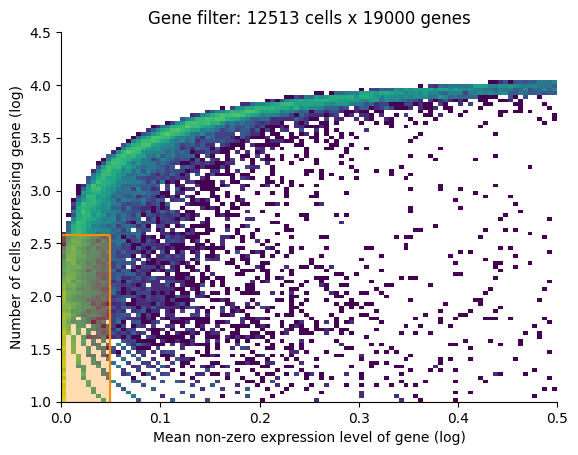

In [ ]:
# select informative genes but keep all barcodes
from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_subset, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
plt.show()

#select all guides by selecting the names which do not start with ENSG in var_names
targeted_tf_guides = list(adata_subset.var_names[~adata_subset.var_names.str.startswith('ENSG')])
#use list comprehension to split targeted_tf_guides by '_' and select the first element of the list
targeted_tf = [x.split('_')[0] for x in targeted_tf_guides]
targeted_tf_ensembl = list(adata_subset.var_names[adata_subset.var['SYMBOL'].isin(targeted_tf).values])
adata_subset = adata_subset[:, np.unique(list(selected) + targeted_tf_guides + targeted_tf_ensembl)].copy()

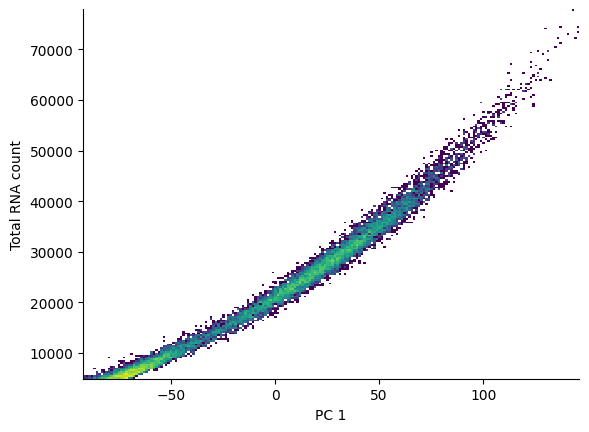

/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


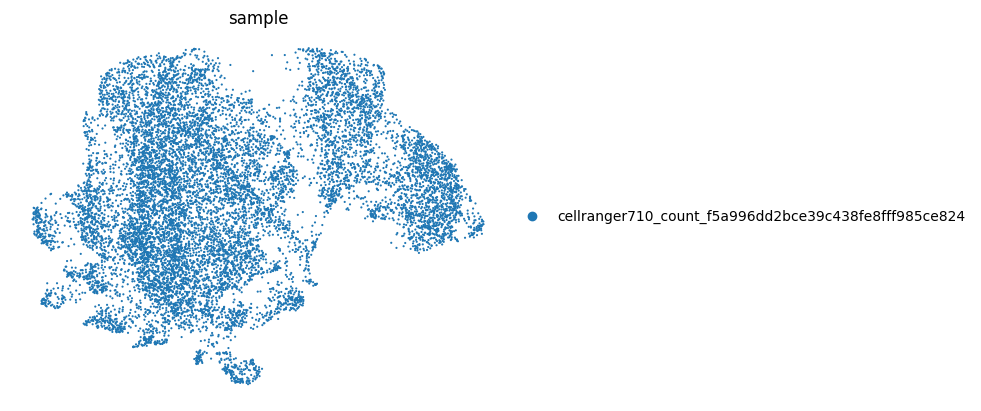

In [ ]:
### Step 1.1 - compute PCs by apply standard workflow with a few exceptions ##
adata_subset = compute_pcs_knn_umap(
    adata_subset, 
    tech_category_key=None, plot_category_keys=None, 
    scale_max_value=10, n_comps=50, n_neighbors=15,
)

In [ ]:
# Plot violin plots for QC metrics
sc.pl.violin(adata_subset, ['n_genes_by_counts', 'total_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True,
             show=False)
plt.savefig(f'{figures_folder}{today}_QC_violin_after_filtering.pdf')

In [ ]:
# Plot QC UMAP without frame
sc.pl.umap(
    adata_subset, color=['mt_frac','total_counts'],
    color_map = 'RdPu', ncols = 3, #legend_loc='on data',
    size=5,
    legend_fontsize=10,
    frameon=False,
    show=False
    )
plt.savefig(f'{figures_folder}{today}_QC_umap_after_filtering.pdf',bbox_inches='tight')

### 2.3 Filter mitochondrial fraction by trying out different threshold

In [ ]:
#assign three categories to new column 'mt_frac' based on thresholding
adata_subset.obs['mt_frac_cutoff'] = pd.cut(adata_subset.obs['mt_frac'], bins=[0,0.2,0.3,0.4,1], labels=['<0.2','0.2x<0.3','0.3<x<0.4','>0.4'])


/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


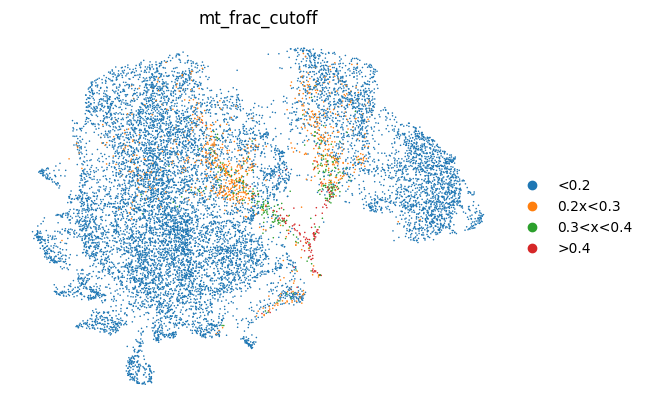

In [ ]:
sc.pl.umap(
    adata_subset, color='mt_frac_cutoff',
    color_map = 'RdPu', ncols = 3, #legend_loc='on data',
    size=5,
    legend_fontsize=10,
    frameon=False,
    show=False
    )

plt.savefig(f'{figures_folder}{today}_mt_frac_cutoff_umap.pdf',bbox_inches='tight')

In [ ]:
#filter adata for cells with mt_frac < 0.25
adata_subset = adata_subset[adata_subset.obs['mt_frac'] < 0.3].copy()

/nfs/team205/kl11/miniconda3/envs/bcftools/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


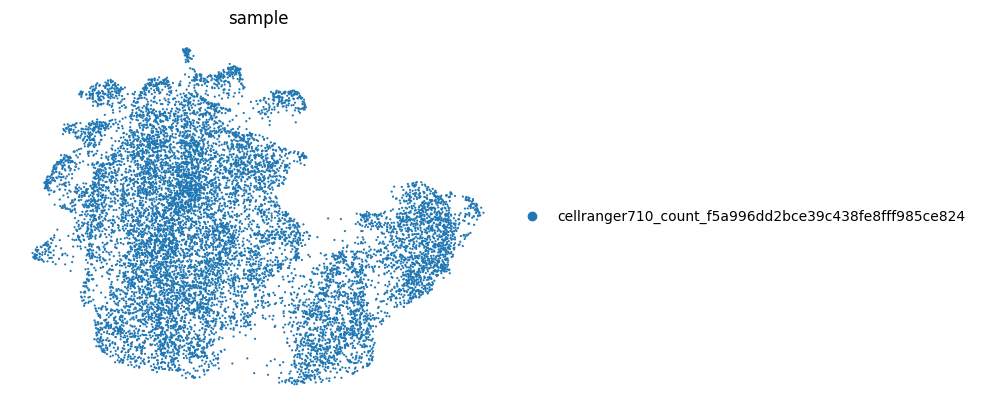

In [ ]:
# recalculate KNN and UMAP to see how well this represents the dataset
sc.pp.neighbors(adata_subset, n_neighbors=15)
sc.tl.umap(adata_subset, min_dist = 0.4, spread = 1.5)

# Plot UMAP
sc.pl.umap(adata_subset, color=[stratify_category_key],
            color_map = 'RdPu', ncols = 3, #legend_loc='on data',
            legend_fontsize=10,
            frameon=False,s
            show=False #show=False to avoid saving empty plots
            )
plt.savefig(f'{figures_folder}{today}_mt_frac_filter_umap.pdf')

In [ ]:
#write adata to h5ad file in the data folder for later use
adata_subset.write(f'/lustre/scratch123/hgi/teams/parts/kl11/cell2state_tf_activation/results/{today}_adata_{dataset}_pre_processed_filtered_above_5000.h5ad')